In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [21]:
import pandas as pd
import numpy as np
import datetime as dt
import folium 
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

from pandas_profiling import ProfileReport

In [ ]:
url = 'https://raw.githubusercontent.com/leilaff89/house_sales_prediction/main/datasets/all_perth_310121.csv'

In [ ]:
df = pd.read_csv(url)
df.head()

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859553,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


In [ ]:
df['DATE_SOLD'] = df['DATE_SOLD'].map(lambda x: x.rstrip('\r'))

In [ ]:
df.DATE_SOLD = pd.to_datetime(df.DATE_SOLD)
df.DATE_SOLD = pd.to_datetime(df.DATE_SOLD).dt.strftime('%m-%Y')

In [43]:
#df.to_csv('/content/drive/MyDrive/house_prices_df(complete).csv', index=False)
df = pd.read_csv('/content/drive/MyDrive/house_prices_df(complete).csv')

In [ ]:
df.head()

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33656 entries, 0 to 33655
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ADDRESS           33656 non-null  object 
 1   SUBURB            33656 non-null  object 
 2   PRICE             33656 non-null  int64  
 3   BEDROOMS          33656 non-null  int64  
 4   BATHROOMS         33656 non-null  int64  
 5   GARAGE            31178 non-null  float64
 6   LAND_AREA         33656 non-null  int64  
 7   FLOOR_AREA        33656 non-null  int64  
 8   BUILD_YEAR        30501 non-null  float64
 9   CBD_DIST          33656 non-null  int64  
 10  NEAREST_STN       33656 non-null  object 
 11  NEAREST_STN_DIST  33656 non-null  int64  
 12  DATE_SOLD         33656 non-null  object 
 13  POSTCODE          33656 non-null  int64  
 14  LATITUDE          33656 non-null  float64
 15  LONGITUDE         33656 non-null  float64
 16  NEAREST_SCH       33656 non-null  object

In [ ]:
df.GARAGE.value_counts()

2.0     20724
1.0      5290
3.0      2042
4.0      1949
6.0       466
5.0       362
8.0       129
7.0        97
12.0       30
10.0       26
9.0        17
14.0       13
13.0        8
11.0        7
16.0        4
18.0        3
20.0        3
32.0        1
26.0        1
50.0        1
21.0        1
31.0        1
17.0        1
22.0        1
99.0        1
Name: GARAGE, dtype: int64

In [ ]:
df.loc[df['BEDROOMS'] == 10]

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
5845,141 Townsend Road,Mariginiup,1585000,10,5,2.0,20250,343,2005.0,25500,Currambine Station,9300,03-2013,6078,-31.723050,115.848690,WANNEROO SECONDARY COLLEGE,5.008192,131.0
10249,2 Corrigan Rise,Wungong,409000,10,3,0.0,12914,323,1986.0,29700,Armadale Station,3100,04-2002,6112,-32.181358,116.020611,ARMADALE SENIOR HIGH SCHOOL,2.283287,NaN


In [ ]:
#replacing null values of the Garage to '0'
df.GARAGE.replace(np.nan, 0, inplace=True)

In [ ]:
df.dropna(subset=['GARAGE', 'BUILD_YEAR'], inplace=True)
df.info()

In [ ]:
#df.to_csv('/content/drive/MyDrive/house_prices_df(without_garage_buildyear_nulls).csv', index=False)

In [ ]:
profile = ProfileReport(df, title='Profiling Perth Houses',html={'style':{'full_width':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
map = folium.Map(location=[df.iloc[30001,14], df.iloc[30001,15]], zoom_start=10)
for i in range(3656):
  i = 30000+i
  circle = folium.Circle((df.iloc[i,14], df.iloc[i,15]), 
                         radius=300, 
                         color='#d35400', 
                         fill=True
                         ).add_child(folium.Popup((df.iloc[i,0])))
  map.add_child(circle)

map

In [ ]:
map.save('/content/drive/MyDrive/map_3.html')

##Vis

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


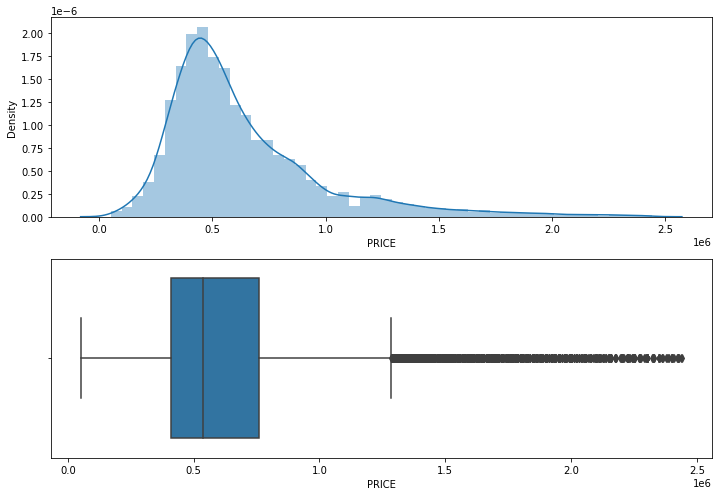

In [22]:
#house prices
fig = plt.figure(figsize=(10,7))
fig.add_subplot(2,1,1)
sns.distplot(df['PRICE'])
fig.add_subplot(2,1,2)
sns.boxplot(df['PRICE'])
plt.tight_layout()

No outliers on price!

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


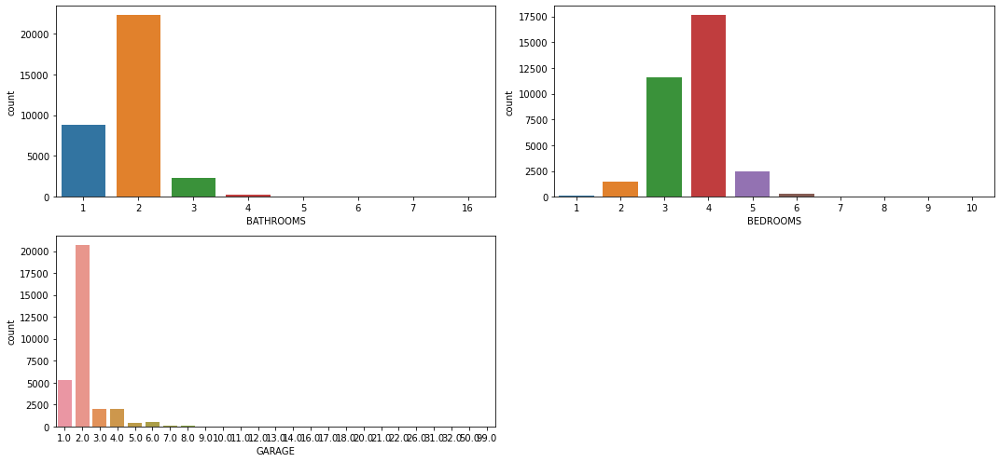

In [23]:
#bathrooms, bedrooms, garage
fig = plt.figure(figsize=(15,7))
fig.add_subplot(2,2,1)
sns.countplot(df['BATHROOMS'])
fig.add_subplot(2,2,2)
sns.countplot(df['BEDROOMS'])
fig.add_subplot(2,2,3)
sns.countplot(df['GARAGE'])
plt.tight_layout()

Search for more details/outliers from garage.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


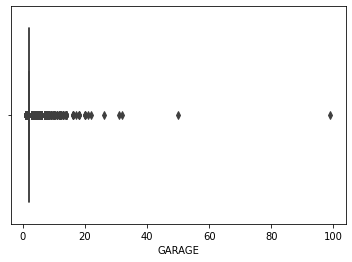

In [24]:
sns.boxplot(df['GARAGE'])

The garage values higher than 20, appears to be outliers.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


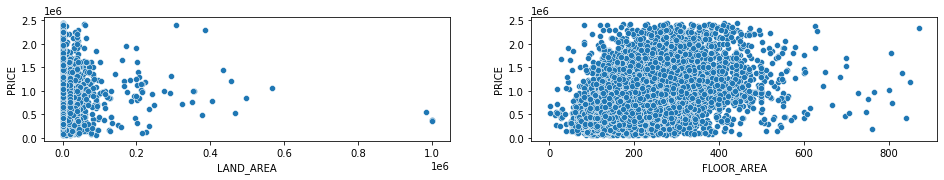

In [28]:
#house areas x price
fig = plt.figure(figsize=(16,5))
fig.add_subplot(2,2,1)
sns.scatterplot(df['LAND_AREA'], df['PRICE'])
fig.add_subplot(2,2,2)
sns.scatterplot(df['FLOOR_AREA'], df['PRICE'])

Areas might not be decisive to determine the price.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


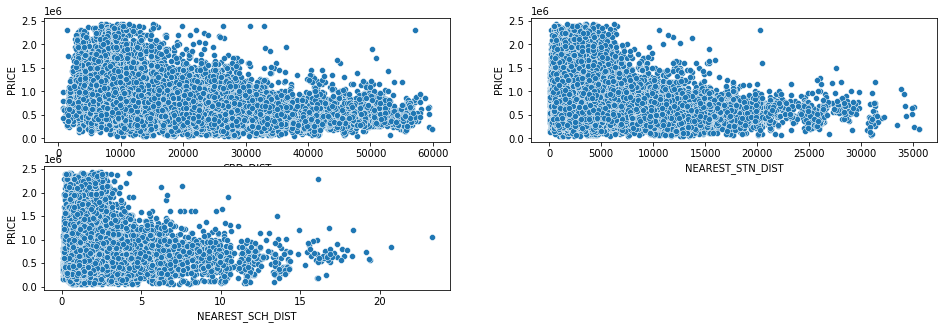

In [27]:
#distances x price
fig = plt.figure(figsize=(16,5))
fig.add_subplot(2,2,1)
sns.scatterplot(df['CBD_DIST'], df['PRICE'])
fig.add_subplot(2,2,2)
sns.scatterplot(df['NEAREST_STN_DIST'], df['PRICE'])
fig.add_subplot(2,2,3)
sns.scatterplot(df['NEAREST_SCH_DIST'], df['PRICE'])

With a bigger distance, the price tends to decrease.

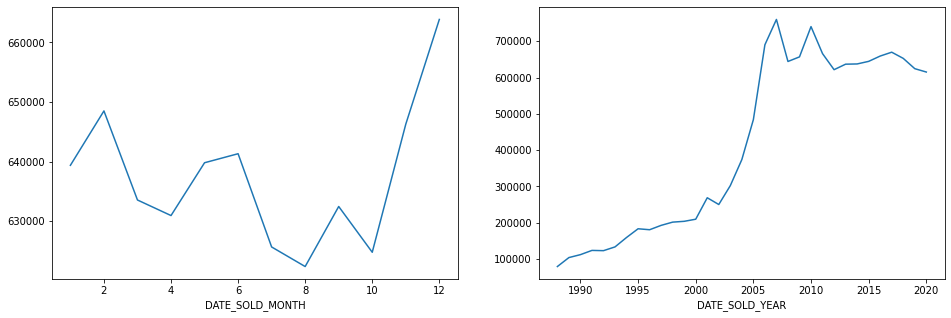

In [46]:
#dates x price
df['DATE_SOLD'] = pd.to_datetime(df['DATE_SOLD'])
df['DATE_SOLD_MONTH'] = df['DATE_SOLD'].apply(lambda date:date.month)
df['DATE_SOLD_YEAR'] = df['DATE_SOLD'].apply(lambda date:date.year)

fig = plt.figure(figsize=(16,5))
fig.add_subplot(1,2,1)
df.groupby('DATE_SOLD_MONTH').mean()['PRICE'].plot()
fig.add_subplot(1,2,2)
df.groupby('DATE_SOLD_YEAR').mean()['PRICE'].plot()

The houses tends to be solded by a higher price in the australian summer.
The prices had a big increase after the year 2000.

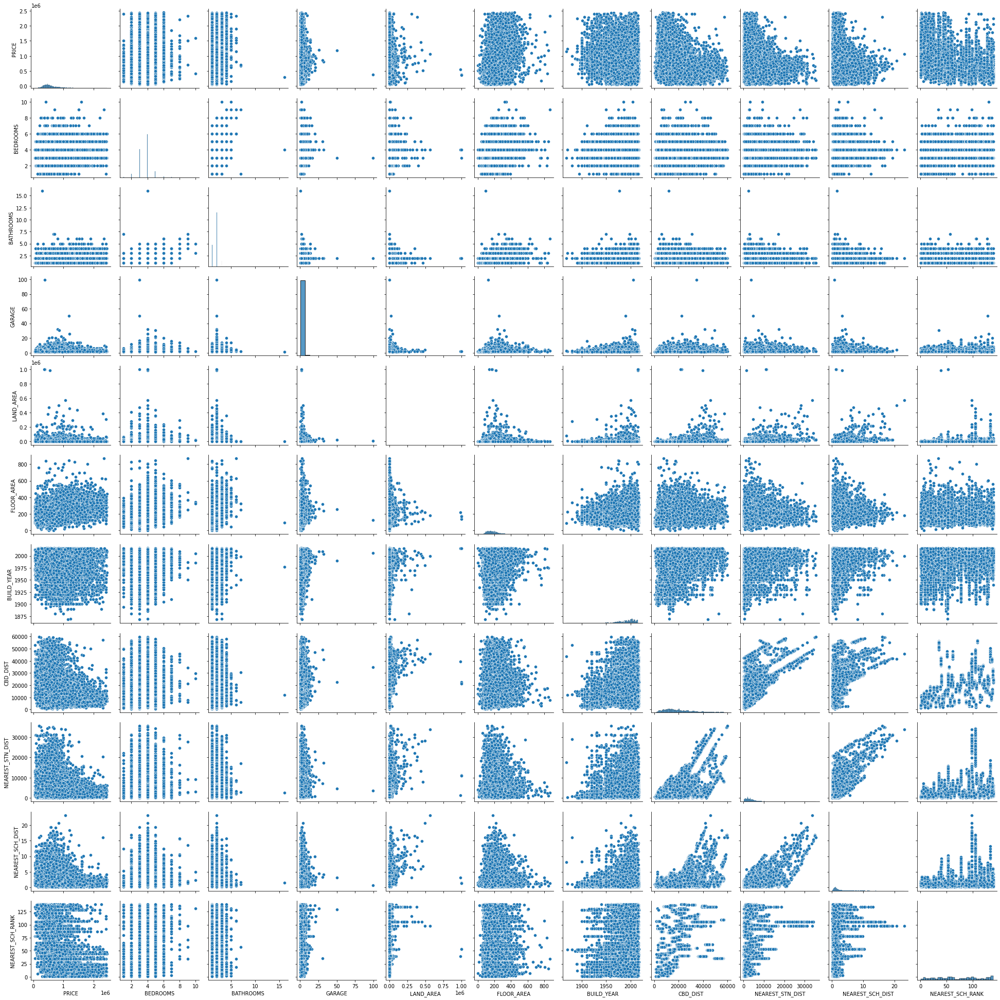

In [19]:
#other general correlation visualizations
df_vis = df[['PRICE','BEDROOMS','BATHROOMS','GARAGE','LAND_AREA','FLOOR_AREA','BUILD_YEAR','CBD_DIST','NEAREST_STN_DIST','NEAREST_SCH_DIST','NEAREST_SCH_RANK']]
sns.pairplot(df_vis)